In [11]:
import math
import pickle

import numpy as np
import matplotlib.pyplot as plt

from scipy import signal
from scipy.ndimage import rotate
from scipy.ndimage import maximum_filter
from scipy.signal import convolve2d

from typing import List, Sequence, Tuple

In [12]:
# --------------------------------------------------
# Data
# --------------------------------------------------

LAYER_NAME = "d4"

TRAJECTORY_RESULTS_PATH = (
    r"C:\Users\ALL AtoZ\Desktop\2d_hippocampal_cells\2D-traj-results-training.pkl"
)

# --------------------------------------------------
# Analysis
# --------------------------------------------------

N_BINS = 40

GAUSSIAN_WINDOW = 9

GAUSSIAN_SIGMA = 3.0

THRESHOLD_K = 1.5

EPS = 1e-10

SKIP_TIMESTEPS = 50

SIGMA = 1.0

GAUSSIAN_KERNEL = (5, 5)

BOUNDS = (0.0, 1.0, 0.0, 1.0)

THRESHOLD_K = 1.0

In [13]:
def get_input_data(
    pkl_path,
    layer_name,
):
    """
    Load the 2D trajectory dataset.

    Returns
    -------
    ground_truth : (n_traj, T, 2)

    prediction : (n_traj, T, 2)

    positions : (n_traj, T, 2)

    activations : (n_traj, T, n_neurons)
    """

    with open(pkl_path, "rb") as f:
        data = pickle.load(f)

    ground_truth = np.asarray(data["ground_truth"])

    prediction = np.asarray(data["prediction"])

    activations = np.asarray(data[layer_name])

    positions = prediction.copy()

    if SKIP_TIMESTEPS > 0:

        ground_truth = ground_truth[:, SKIP_TIMESTEPS:, :]

        prediction = prediction[:, SKIP_TIMESTEPS:, :]

        positions = positions[:, SKIP_TIMESTEPS:, :]

        activations = activations[:, SKIP_TIMESTEPS:, :]

    return (
        ground_truth,
        prediction,
        positions,
        activations,
    )
def get_arena_bounds(positions):
    """
    Compute global arena bounds across all trajectories.

    Parameters
    ----------
    positions : ndarray
        Shape (n_traj, T, 2)

    Returns
    -------
    bounds : tuple
        (xmin, xmax, ymin, ymax)
    """

    xmin = np.min(positions[:, :, 0])
    xmax = np.max(positions[:, :, 0])

    ymin = np.min(positions[:, :, 1])
    ymax = np.max(positions[:, :, 1])

    return (
        float(xmin),
        float(xmax),
        float(ymin),
        float(ymax),
    )
def get_arena_bounds(positions_list):
    """
    Compute global arena bounds shared across every trajectory.
    """

    all_positions = np.concatenate(positions_list, axis=0)

    xmin = np.min(all_positions[:,0])
    xmax = np.max(all_positions[:,0])

    ymin = np.min(all_positions[:,1])
    ymax = np.max(all_positions[:,1])

    return (
        float(xmin),
        float(xmax),
        float(ymin),
        float(ymax),
    )
def bin_positions(
    positions,
    bins=N_BINS,
    bounds=None,
):
    """
    Assign every (x, y) position sample to a spatial bin.

    Parameters
    ----------
    positions : ndarray
        Shape (T, 2)

    bins : int
        Number of bins along each dimension.

    bounds : tuple
        (xmin, xmax, ymin, ymax)

    Returns
    -------
    x_bin : ndarray
        Shape (T,)

    y_bin : ndarray
        Shape (T,)

    x_edges : ndarray
        Bin edges along x.

    y_edges : ndarray
        Bin edges along y.
    """

    xmin, xmax, ymin, ymax = bounds

    x_edges = np.linspace(xmin, xmax, bins + 1)
    y_edges = np.linspace(ymin, ymax, bins + 1)

    x_bin = np.digitize(
        positions[:, 0],
        x_edges,
    ) - 1

    y_bin = np.digitize(
        positions[:, 1],
        y_edges,
    ) - 1

    # Keep indices inside the grid
    x_bin = np.clip(x_bin, 0, bins - 1)
    y_bin = np.clip(y_bin, 0, bins - 1)

    return x_bin, y_bin, x_edges, y_edges
def compute_occupancy_maps(
    x_bin,
    y_bin,
    bins=N_BINS,
):
    """
    Compute 2D occupancy maps.

    Parameters
    ----------
    x_bin : ndarray
    y_bin : ndarray

    Returns
    -------
    count_occupancy : (bins,bins)

    probability_occupancy : (bins,bins)
    """

    count_occupancy = np.zeros((bins, bins), dtype=float)

    # Count visits
    for xb, yb in zip(x_bin, y_bin):
        count_occupancy[yb, xb] += 1

    total = np.sum(count_occupancy)

    if total > 0:
        probability_occupancy = count_occupancy / total
    else:
        probability_occupancy = np.zeros_like(count_occupancy)

    return count_occupancy, probability_occupancy
def compute_activity_maps(
    activity,
    x_bin,
    y_bin,
    bins=N_BINS,
    threshold_k=THRESHOLD_K,
):
    """
    Compute activity maps for one neuron.

    Activity below mean + k*std is removed.
    """

    amplitude = np.abs(activity)

    # ---------------------------------
    # Threshold activity
    # ---------------------------------
    threshold = amplitude.mean() + threshold_k * amplitude.std()

    amplitude = np.where(
        amplitude >= threshold,
        amplitude,
        0.0,
    )

    real = np.real(activity)

    amplitude_activity = np.zeros((bins, bins), dtype=float)
    real_activity = np.zeros((bins, bins), dtype=float)

    for a, r, xb, yb in zip(
        amplitude,
        real,
        x_bin,
        y_bin,
    ):
        amplitude_activity[yb, xb] += a
        real_activity[yb, xb] += r

    return (
        amplitude_activity,
        real_activity,
        threshold,
    )
"""

def compute_activity_maps(
    activity,
    x_bin,
    y_bin,
    bins=N_BINS,
):

"""
"""
Compute 2D activity maps for ONE neuron.

    Parameters
    ----------
    activity : ndarray
        Shape (T,)

    x_bin : ndarray
        Shape (T,)

    y_bin : ndarray
        Shape (T,)

    Returns
    -------
    amplitude_activity : (bins, bins)

    real_activity : (bins, bins) 

"""

"""
    amplitude = np.abs(activity)

    real = np.real(activity)

    amplitude_activity = np.zeros((bins, bins), dtype=float)

    real_activity = np.zeros((bins, bins), dtype=float)

    for a, r, xb, yb in zip(
        amplitude,
        real,
        x_bin,
        y_bin,
    ):

        amplitude_activity[yb, xb] += a

        real_activity[yb, xb] += r

    return amplitude_activity, real_activity """
def compute_firing_rate_map(
    activity_map,
    occupancy_map,
    activity_threshold=0.00,
    peak_fraction=0.2,
    eps=EPS,
):
    """
    Compute firing-rate map with activity and firing-rate thresholds.

    Parameters
    ----------
    activity_map : ndarray
    occupancy_map : ndarray
    activity_threshold : float
        Minimum activity to include.
    peak_fraction : float
        Fraction of the peak firing rate to keep.
    """

    # Copy so the original isn't modified
    activity = activity_map.copy()
    
    activity_threshold = np.mean(activity_map) + np.std(activity_map)

    # Step 1: Remove weak activity
    activity[activity < activity_threshold] = 0

    # Compute firing rate
    firing_rate = np.divide(
        activity,
        occupancy_map + eps,
    )

    firing_rate[occupancy_map == 0] = 0

    # Step 2: Keep only bins above a fraction of the peak
    peak = firing_rate.max()

    if peak > 0:
        firing_rate[firing_rate < peak_fraction * peak] = 0

    return firing_rate
from scipy.signal import convolve2d


def matlab_style_gauss2D(shape=(5, 5), sigma=1.0):
    """
    2D Gaussian mask equivalent to MATLAB's

        fspecial('gaussian', shape, sigma)

    Parameters
    ----------
    shape : tuple
        Size of the Gaussian kernel.

    sigma : float
        Standard deviation of the Gaussian.

    Returns
    -------
    h : ndarray
        Normalized Gaussian kernel.
    """

    m, n = [(ss - 1.) / 2. for ss in shape]

    y, x = np.ogrid[-m:m+1, -n:n+1]

    h = np.exp(-(x*x + y*y) / (2.0 * sigma * sigma))

    h[h < np.finfo(h.dtype).eps * h.max()] = 0

    if h.sum() != 0:
        h /= h.sum()

    return h


def smooth_firing_rate_map(
    firing_rate_map,
    sigma=SIGMA,
    kernel_shape=GAUSSIAN_KERNEL,
):
    """
    Smooth a firing-rate map using a MATLAB-style Gaussian kernel.

    Parameters
    ----------
    firing_rate_map : ndarray
        2D firing-rate map.

    sigma : float
        Gaussian standard deviation.

    kernel_shape : tuple
        Kernel size used by MATLAB's fspecial.
    """

    kernel = matlab_style_gauss2D(
        shape=kernel_shape,
        sigma=sigma,
    )

    smoothed = convolve2d(
        firing_rate_map,
        kernel,
        mode="same",
        boundary="symm",
    )

    return smoothed
def spatial_information(rate_map, occupancy_map):
    """
    Spatial Information (bits/spike)

    Parameters
    ----------
    rate_map : ndarray
        Smoothed firing-rate map

    occupancy_map : ndarray
        Count or probability occupancy
    """

    occ = occupancy_map.astype(float)
    occ = occ / occ.sum()

    valid = (
        (~np.isnan(rate_map))
        & (occ > 0)
        & (rate_map > 0)
    )

    if np.sum(valid) == 0:
        return np.nan

    p = occ[valid]
    r = rate_map[valid]

    r_bar = np.sum(p * r)

    if r_bar <= EPS:
        return np.nan

    ratio = r / r_bar

    return np.sum(
        p * ratio * np.log2(ratio)
    )
def sparsity(rate_map, occupancy_map):
    """
    Population sparsity
    """

    occ = occupancy_map.astype(float)
    occ = occ / occ.sum()

    valid = (
        (~np.isnan(rate_map))
        & (occ > 0)
    )

    if np.sum(valid) == 0:
        return np.nan

    p = occ[valid]
    r = rate_map[valid]

    mean_r = np.sum(p * r)
    mean_r2 = np.sum(p * r**2)

    if mean_r2 <= EPS:
        return np.nan

    return (mean_r**2) / mean_r2
def evaluate_place_cell(rate_map, occupancy_map):
    """
    Compute place-cell metrics from a raw firing-rate map.
    """

    return {
        "Spatial Information": spatial_information(
            rate_map,
            occupancy_map,
        ),
        "Sparsity": sparsity(
            rate_map,
            occupancy_map,
        ),
    }

In [15]:
LAYER_NAME = "d4"

TRAJECTORY_RESULTS_PATH = (
    r"C:\Users\ALL AtoZ\Desktop\2d_hippocampal_cells\2D-traj-results-training.pkl"
)



ground_truth, prediction, positions, activations = get_input_data(
    TRAJECTORY_RESULTS_PATH,
    LAYER_NAME,
)

print("Ground Truth :", ground_truth.shape)
print("Prediction   :", prediction.shape)
print("Positions    :", positions.shape)
print("Activations  :", activations.shape)



Ground Truth : (500, 450, 2)
Prediction   : (500, 450, 2)
Positions    : (500, 450, 2)
Activations  : (500, 450, 100)


In [16]:
# ============================================================
# PLACE CELL ANALYSIS — RESET
# ============================================================



import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# ------------------------------------------------------------
# Spatial resolution
# ------------------------------------------------------------

N_BINS = 40

# Environment boundaries
X_MIN, X_MAX = 0.0, 1.0
Y_MIN, Y_MAX = 0.0, 1.0

BOUNDS = (
    X_MIN,
    X_MAX,
    Y_MIN,
    Y_MAX,
)

# ------------------------------------------------------------
# Spatial bin edges
# ------------------------------------------------------------

x_edges = np.linspace(
    X_MIN,
    X_MAX,
    N_BINS + 1
)

y_edges = np.linspace(
    Y_MIN,
    Y_MAX,
    N_BINS + 1
)

# ------------------------------------------------------------
# Reference environment
# ------------------------------------------------------------
# A spatial bin belongs to the environment if it is visited
# by at least one trajectory.

environment_counts, _, _ = np.histogram2d(
    positions[:, :, 0].ravel(),
    positions[:, :, 1].ravel(),
    bins=[x_edges, y_edges]
)

environment_mask = (
    environment_counts > 0
)

n_environment_bins = (
    environment_mask.sum()
)

# ------------------------------------------------------------
# Firing-rate parameters
# ------------------------------------------------------------

THRESHOLD_K = 1.5

GAUSSIAN_WINDOW = 9
GAUSSIAN_SIGMA = 3.0

EPS = 1e-10

# ------------------------------------------------------------
# Check data
# ------------------------------------------------------------

print(
    "Ground truth :",
    ground_truth.shape
)

print(
    "Prediction   :",
    prediction.shape
)

print(
    "Positions    :",
    positions.shape
)

print(
    "Activations  :",
    activations.shape
)

print(
    "\nN_BINS:",
    N_BINS
)

print(
    "Bounds:",
    BOUNDS
)

print(
    "Environment bins:",
    n_environment_bins
)

Ground truth : (500, 450, 2)
Prediction   : (500, 450, 2)
Positions    : (500, 450, 2)
Activations  : (500, 450, 100)

N_BINS: 40
Bounds: (0.0, 1.0, 0.0, 1.0)
Environment bins: 1381


In [17]:
# ============================================================
# RANDOM SAMPLING CONVERGENCE
# ============================================================

N_RANDOM_TRIALS = 100
MAX_TRAJECTORIES = 10

rng = np.random.default_rng(42)

coverage_all = np.zeros(
    (N_RANDOM_TRIALS, MAX_TRAJECTORIES)
)

for trial in range(N_RANDOM_TRIALS):

    # Randomly choose 10 unique trajectories
    random_traj = rng.choice(
        len(positions),
        size=MAX_TRAJECTORIES,
        replace=False
    )

    cumulative_mask = np.zeros(
        (N_BINS, N_BINS),
        dtype=bool
    )

    for n in range(MAX_TRAJECTORIES):

        traj_id = random_traj[n]
        traj = positions[traj_id]

        traj_counts, _, _ = np.histogram2d(
            traj[:, 0],
            traj[:, 1],
            bins=[x_edges, y_edges]
        )

        # Add trajectory's visited bins
        cumulative_mask |= (
            traj_counts > 0
        )

        # Compare against reference environment
        covered = (
            cumulative_mask
            &
            environment_mask
        )

        coverage_all[
            trial,
            n
        ] = (
            covered.sum()
            / n_environment_bins
        )


# ============================================================
# Calculate statistics
# ============================================================

mean_coverage = coverage_all.mean(
    axis=0
)

std_coverage = coverage_all.std(
    axis=0
)

lower_coverage = np.percentile(
    coverage_all,
    2.5,
    axis=0
)

upper_coverage = np.percentile(
    coverage_all,
    97.5,
    axis=0
)


# ============================================================
# Print results
# ============================================================

print("Random sampling convergence")
print("=" * 45)

for n in range(MAX_TRAJECTORIES):

    print(
        f"{n+1:2d} trajectories | "
        f"mean = "
        f"{mean_coverage[n] * 100:6.2f}% | "
        f"SD = "
        f"{std_coverage[n] * 100:5.2f}% | "
        f"95% CI = "
        f"{lower_coverage[n] * 100:5.2f}%–"
        f"{upper_coverage[n] * 100:5.2f}%"
    )

Random sampling convergence
 1 trajectories | mean =   9.67% | SD =  3.13% | 95% CI =  4.33%–14.30%
 2 trajectories | mean =  17.92% | SD =  3.59% | 95% CI = 10.34%–24.55%
 3 trajectories | mean =  26.04% | SD =  4.07% | 95% CI = 17.53%–33.43%
 4 trajectories | mean =  32.85% | SD =  4.44% | 95% CI = 23.41%–40.15%
 5 trajectories | mean =  39.06% | SD =  4.72% | 95% CI = 30.14%–47.11%
 6 trajectories | mean =  44.51% | SD =  4.54% | 95% CI = 35.07%–51.32%
 7 trajectories | mean =  48.73% | SD =  4.59% | 95% CI = 39.89%–56.48%
 8 trajectories | mean =  52.58% | SD =  4.70% | 95% CI = 43.87%–60.25%
 9 trajectories | mean =  56.07% | SD =  4.39% | 95% CI = 47.28%–62.65%
10 trajectories | mean =  59.35% | SD =  4.09% | 95% CI = 51.37%–65.76%


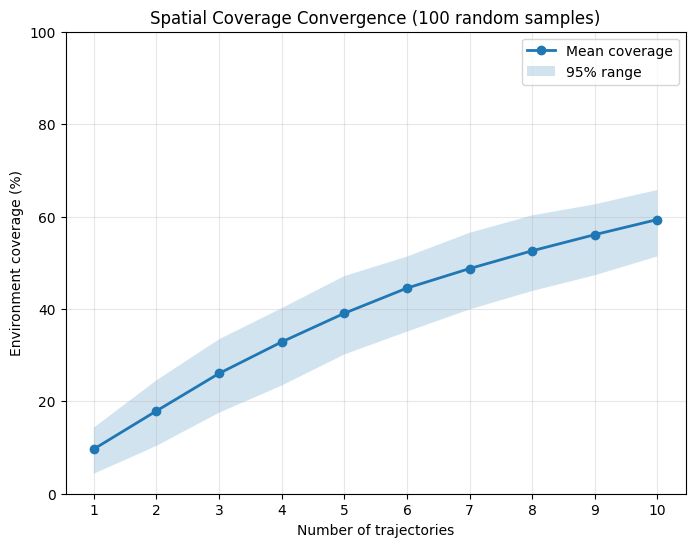

In [18]:
# ============================================================
# CONVERGENCE PLOT
# ============================================================

x = np.arange(
    1,
    MAX_TRAJECTORIES + 1
)

plt.figure(figsize=(8, 6))

plt.plot(
    x,
    mean_coverage * 100,
    marker="o",
    linewidth=2,
    label="Mean coverage"
)

plt.fill_between(
    x,
    lower_coverage * 100,
    upper_coverage * 100,
    alpha=0.2,
    label="95% range"
)

plt.xlabel(
    "Number of trajectories"
)

plt.ylabel(
    "Environment coverage (%)"
)

plt.title(
    f"Spatial Coverage Convergence "
    f"({N_RANDOM_TRIALS} random samples)"
)

plt.xticks(x)

plt.ylim(0, 100)

plt.grid(alpha=0.3)

plt.legend()

plt.show()

In [19]:
# ============================================================
# GREEDY SELECTION OF 10 TRAJECTORIES FOR MAXIMUM COVERAGE
# ============================================================

N_SELECT = 10

# ------------------------------------------------------------
# 1. Precompute spatial-bin mask for every trajectory
# ------------------------------------------------------------

trajectory_masks = []

for traj_id in range(len(positions)):

    traj = positions[traj_id]

    counts, _, _ = np.histogram2d(
        traj[:, 0],
        traj[:, 1],
        bins=[x_edges, y_edges]
    )

    trajectory_masks.append(
        counts > 0
    )

trajectory_masks = np.array(
    trajectory_masks
)

print(
    "Trajectory masks:",
    trajectory_masks.shape
)


# ------------------------------------------------------------
# 2. Greedy selection
# ------------------------------------------------------------

selected_traj = []

cumulative_mask = np.zeros(
    (N_BINS, N_BINS),
    dtype=bool
)

coverage_values = []

remaining = set(
    range(len(positions))
)

for step in range(N_SELECT):

    best_traj = None
    best_new_bins = -1

    # Find trajectory adding the most
    # previously uncovered bins
    for traj_id in remaining:

        candidate_mask = (
            trajectory_masks[traj_id]
        )

        new_bins = (
            candidate_mask
            &
            environment_mask
            &
            ~cumulative_mask
        ).sum()

        if new_bins > best_new_bins:

            best_new_bins = new_bins
            best_traj = traj_id

    # Add best trajectory
    selected_traj.append(
        best_traj
    )

    cumulative_mask |= (
        trajectory_masks[best_traj]
    )

    remaining.remove(
        best_traj
    )

    # Calculate coverage
    covered = (
        cumulative_mask
        &
        environment_mask
    )

    coverage = (
        covered.sum()
        /
        n_environment_bins
    )

    coverage_values.append(
        coverage
    )

    print(
        f"{step + 1:2d} trajectories | "
        f"added trajectory "
        f"{best_traj:3d} | "
        f"new bins = "
        f"{best_new_bins:4d} | "
        f"coverage = "
        f"{coverage * 100:6.2f}%"
    )


# ------------------------------------------------------------
# 3. Final result
# ------------------------------------------------------------

print(
    "\n========================================"
)

print(
    "FINAL SELECTED TRAJECTORIES"
)

print(
    "========================================"
)

print(
    selected_traj
)

print(
    f"\nFinal coverage: "
    f"{coverage_values[-1] * 100:.2f}%"
)

Trajectory masks: (500, 40, 40)
 1 trajectories | added trajectory 342 | new bins =  216 | coverage =  15.64%
 2 trajectories | added trajectory 397 | new bins =  181 | coverage =  28.75%
 3 trajectories | added trajectory  56 | new bins =  145 | coverage =  39.25%
 4 trajectories | added trajectory 234 | new bins =  128 | coverage =  48.52%
 5 trajectories | added trajectory 220 | new bins =  112 | coverage =  56.63%
 6 trajectories | added trajectory  30 | new bins =   95 | coverage =  63.50%
 7 trajectories | added trajectory 343 | new bins =   72 | coverage =  68.72%
 8 trajectories | added trajectory 456 | new bins =   63 | coverage =  73.28%
 9 trajectories | added trajectory 201 | new bins =   48 | coverage =  76.76%
10 trajectories | added trajectory 378 | new bins =   43 | coverage =  79.87%

FINAL SELECTED TRAJECTORIES
[342, 397, 56, 234, 220, 30, 343, 456, 201, 378]

Final coverage: 79.87%


In [20]:
# ============================================================
# FROZEN TRAJECTORIES — DO NOT CHANGE BELOW THIS CELL
# ============================================================

selected_traj = [
    342,
    397,
    56,
    234,
    220,
    30,
    343,
    456,
    201,
    378
]

N_TRAJECTORIES = len(selected_traj)
N_NEURONS = activations.shape[2]

print("Frozen trajectories:")
print(selected_traj)

print("\nNumber of trajectories:", N_TRAJECTORIES)
print("Number of neurons:", N_NEURONS)

# Safety check
assert len(selected_traj) == 10
assert len(set(selected_traj)) == 10
assert min(selected_traj) >= 0
assert max(selected_traj) < len(positions)

print("\n✓ Trajectories successfully frozen.")

Frozen trajectories:
[342, 397, 56, 234, 220, 30, 343, 456, 201, 378]

Number of trajectories: 10
Number of neurons: 100

✓ Trajectories successfully frozen.


In [21]:
# ============================================================
# OCCUPANCY PROBABILITY — FROZEN TRAJECTORIES
# ============================================================

occupancy_probability = np.zeros(
    (
        N_TRAJECTORIES,
        N_BINS,
        N_BINS
    ),
    dtype=float
)

for t, traj_id in enumerate(selected_traj):

    pos = positions[traj_id]

    counts, _, _ = np.histogram2d(
        pos[:, 0],
        pos[:, 1],
        bins=[x_edges, y_edges]
    )

    total = counts.sum()

    if total > 0:
        occupancy_probability[t] = (
            counts / total
        )

print(
    "Occupancy probability shape:",
    occupancy_probability.shape
)

print(
    "Probability sums:",
    occupancy_probability.sum(axis=(1, 2))
)

Occupancy probability shape: (10, 40, 40)
Probability sums: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [32]:
# ============================================================
# OCCUPANCY MAPS — ONE PER TRAJECTORY
# ============================================================

# ------------------------------------------------------------
# Storage
# ------------------------------------------------------------

# Raw number of visits to each spatial bin
occupancy_counts = np.zeros(
    (
        N_TRAJECTORIES,
        N_BINS,
        N_BINS
    ),
    dtype=float
)

# Probability of occupying each spatial bin
occupancy_probability = np.zeros(
    (
        N_TRAJECTORIES,
        N_BINS,
        N_BINS
    ),
    dtype=float
)


# ------------------------------------------------------------
# Calculate occupancy independently for each trajectory
# ------------------------------------------------------------

for t, traj_id in enumerate(selected_traj):

    # Positions for THIS trajectory
    pos = positions[traj_id]

    # Count visits to every spatial bin
    counts, _, _ = np.histogram2d(
        pos[:, 0],
        pos[:, 1],
        bins=[x_edges, y_edges]
    )

    # Store raw visit counts
    occupancy_counts[t] = counts

    # --------------------------------------------------------
    # Convert counts → occupancy probability
    # --------------------------------------------------------

    total_visits = counts.sum()

    if total_visits > 0:

        occupancy_probability[t] = (
            counts / total_visits
        )


# ------------------------------------------------------------
# Sanity checks
# ------------------------------------------------------------

print("Occupancy counts shape:")
print(occupancy_counts.shape)

print("\nOccupancy probability shape:")
print(occupancy_probability.shape)

print("\nTotal visits per trajectory:")
print(
    occupancy_counts.sum(axis=(1, 2))
)

print("\nOccupancy probability sums:")
print(
    occupancy_probability.sum(axis=(1, 2))
)

Occupancy counts shape:
(10, 40, 40)

Occupancy probability shape:
(10, 40, 40)

Total visits per trajectory:
[450. 450. 450. 450. 450. 450. 450. 450. 450. 450.]

Occupancy probability sums:
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


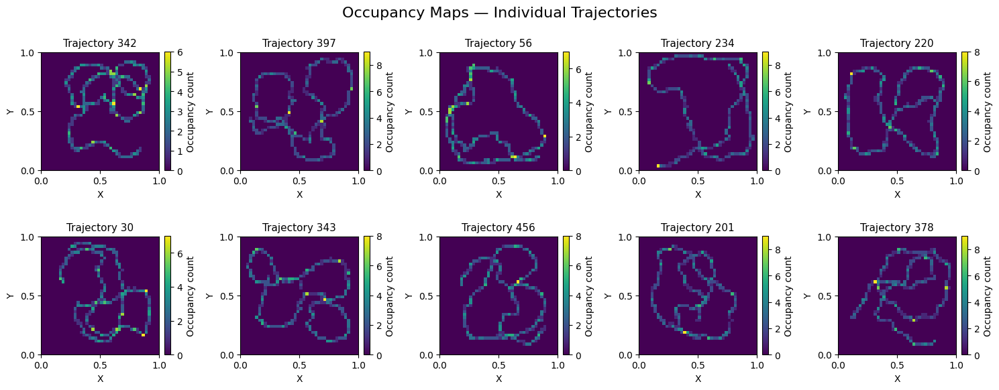

In [33]:
# ============================================================
# OCCUPANCY MAPS — VISUAL CHECK
# ============================================================

fig, axes = plt.subplots(
    2,
    5,
    figsize=(15, 6)
)

axes = axes.ravel()

for t, traj_id in enumerate(selected_traj):

    ax = axes[t]

    im = ax.imshow(
        occupancy_maps[t].T,
        origin="lower",
        extent=BOUNDS,
        aspect="equal",
        cmap="viridis"
    )

    ax.set_title(
        f"Trajectory {traj_id}",
        fontsize=11
    )

    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    plt.colorbar(
        im,
        ax=ax,
        fraction=0.046,
        pad=0.04,
        label="Occupancy count"
    )

plt.suptitle(
    "Occupancy Maps — Individual Trajectories",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [34]:
# ============================================================
# INDIVIDUAL TRAJECTORY × NEURON ANALYSIS
# ============================================================

N_NEURONS = activations.shape[2]
N_TRAJECTORIES = len(selected_traj)

print("Neurons:", N_NEURONS)
print("Trajectories:", N_TRAJECTORIES)


# ------------------------------------------------------------
# Storage
# ------------------------------------------------------------

rate_maps = np.full(
    (
        N_TRAJECTORIES,
        N_NEURONS,
        N_BINS,
        N_BINS
    ),
    np.nan,
    dtype=float
)


# ------------------------------------------------------------
# Calculate independently for every
# trajectory × neuron
# ------------------------------------------------------------

for t, traj_id in enumerate(selected_traj):

    print(
        f"Processing trajectory "
        f"{t + 1}/{N_TRAJECTORIES} "
        f"(ID = {traj_id})..."
    )

    # Positions for THIS trajectory
    pos = positions[traj_id]

    # Raw occupancy counts for THIS trajectory
    occupancy = occupancy_counts[t]

    for neuron in range(N_NEURONS):

        # ----------------------------------------------------
        # Activity of THIS neuron
        # ----------------------------------------------------

        responses = activations[
            traj_id,
            :,
            neuron
        ]

        amplitude = np.abs(responses)

        # ----------------------------------------------------
        # Aggregate activity in each spatial bin
        # ----------------------------------------------------

        activity_map = np.zeros(
            (N_BINS, N_BINS),
            dtype=float
        )

        for a, x, y in zip(
            amplitude,
            pos[:, 0],
            pos[:, 1]
        ):

            # Determine spatial bin
            x_idx = np.searchsorted(
                x_edges,
                x,
                side="right"
            ) - 1

            y_idx = np.searchsorted(
                y_edges,
                y,
                side="right"
            ) - 1

            # Keep indices inside the arena
            x_idx = np.clip(
                x_idx,
                0,
                N_BINS - 1
            )

            y_idx = np.clip(
                y_idx,
                0,
                N_BINS - 1
            )

            # Aggregate activity
            activity_map[
                y_idx,
                x_idx
            ] += a

        # ----------------------------------------------------
        # Mean activity per visit
        #
        #             total activity
        # rate = --------------------------
        #             number of visits
        # ----------------------------------------------------

        firing_rate = np.divide(
            activity_map,
            occupancy,
            out=np.zeros_like(activity_map),
            where=occupancy > 0
        )

        # ----------------------------------------------------
        # Smooth
        # ----------------------------------------------------

        firing_rate = smooth_firing_rate_map(
            firing_rate,
            sigma=1.0,
            kernel_shape=(5, 5)
        )

        # ----------------------------------------------------
        # Unvisited bins remain undefined
        # ----------------------------------------------------

        firing_rate[
            occupancy == 0
        ] = np.nan

        # Store
        rate_maps[
            t,
            neuron
        ] = firing_rate


print("\nRate maps shape:")
print(rate_maps.shape)

Neurons: 100
Trajectories: 10
Processing trajectory 1/10 (ID = 342)...
Processing trajectory 2/10 (ID = 397)...
Processing trajectory 3/10 (ID = 56)...
Processing trajectory 4/10 (ID = 234)...
Processing trajectory 5/10 (ID = 220)...
Processing trajectory 6/10 (ID = 30)...
Processing trajectory 7/10 (ID = 343)...
Processing trajectory 8/10 (ID = 456)...
Processing trajectory 9/10 (ID = 201)...
Processing trajectory 10/10 (ID = 378)...

Rate maps shape:
(10, 100, 40, 40)


Rate maps shape: (10, 100, 40, 40)
Minimum firing rate: 0.0
Maximum firing rate: 2.3563050576589335
Mean firing rate: 0.04293330095976825


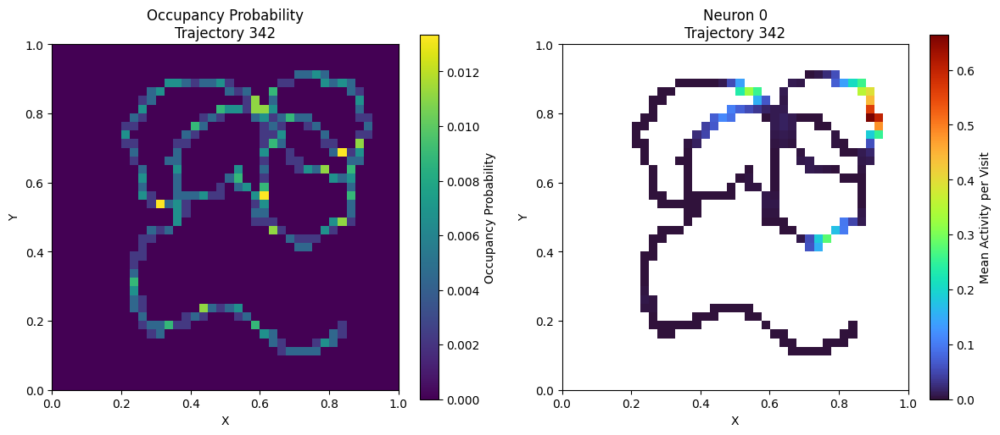


OCCUPANCY SANITY CHECK
Trajectory: 342
Total position samples: 450.0
Occupancy probability sum: 0.9999999999999999
Minimum occupancy probability: 0.0
Maximum occupancy probability: 0.013333333333333334


In [35]:
# ============================================================
# OCCUPANCY + RATE MAP SANITY CHECK
# ============================================================

print("Rate maps shape:", rate_maps.shape)

print(
    "Minimum firing rate:",
    np.nanmin(rate_maps)
)

print(
    "Maximum firing rate:",
    np.nanmax(rate_maps)
)

print(
    "Mean firing rate:",
    np.nanmean(rate_maps)
)


# ------------------------------------------------------------
# Check one example
# ------------------------------------------------------------

example_traj = 0
example_neuron = 0

traj_id = selected_traj[example_traj]


# ============================================================
# PLOT
# ============================================================

fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 5)
)


# ------------------------------------------------------------
# OCCUPANCY PROBABILITY
# ------------------------------------------------------------

occupancy = occupancy_probability[
    example_traj
]

im1 = axes[0].imshow(
    occupancy.T,
    origin="lower",
    extent=BOUNDS,
    aspect="equal",
    cmap="viridis"
)

axes[0].set_xlabel("X")
axes[0].set_ylabel("Y")

axes[0].set_title(
    f"Occupancy Probability\n"
    f"Trajectory {traj_id}"
)

plt.colorbar(
    im1,
    ax=axes[0],
    label="Occupancy Probability"
)


# ------------------------------------------------------------
# FIRING RATE
# ------------------------------------------------------------

rate_map = rate_maps[
    example_traj,
    example_neuron
]

im2 = axes[1].imshow(
    rate_map.T,
    origin="lower",
    extent=BOUNDS,
    aspect="equal",
    cmap="turbo"
)

axes[1].set_xlabel("X")
axes[1].set_ylabel("Y")

axes[1].set_title(
    f"Neuron {example_neuron}\n"
    f"Trajectory {traj_id}"
)

plt.colorbar(
    im2,
    ax=axes[1],
    label="Mean Activity per Visit"
)


plt.tight_layout()
plt.show()


# ============================================================
# OCCUPANCY SANITY CHECK
# ============================================================

print("\n" + "=" * 50)
print("OCCUPANCY SANITY CHECK")
print("=" * 50)

print(
    "Trajectory:",
    traj_id
)

print(
    "Total position samples:",
    occupancy_counts[
        example_traj
    ].sum()
)

print(
    "Occupancy probability sum:",
    occupancy.sum()
)

print(
    "Minimum occupancy probability:",
    occupancy.min()
)

print(
    "Maximum occupancy probability:",
    occupancy.max()
)

In [37]:
# ============================================================
# SMOOTH FIRING-RATE MAP
# ============================================================

from scipy.signal import convolve2d


def matlab_style_gauss2D(
    shape=(5, 5),
    sigma=1.0
):
    """
    Create a normalized 2D Gaussian kernel.
    """

    m, n = [
        (size - 1.0) / 2.0
        for size in shape
    ]

    y, x = np.ogrid[
        -m:m + 1,
        -n:n + 1
    ]

    kernel = np.exp(
        -(x * x + y * y)
        / (2.0 * sigma * sigma)
    )

    kernel[
        kernel < np.finfo(float).eps * kernel.max()
    ] = 0

    kernel /= kernel.sum()

    return kernel


def smooth_firing_rate_map(
    firing_rate_map,
    occupancy_map,
    sigma=1.0,
    kernel_shape=(5, 5)
):
    """
    Smooth a firing-rate map AFTER firing rate has been calculated.

    Parameters
    ----------
    firing_rate_map : ndarray
        Raw firing-rate map.

    occupancy_map : ndarray
        Raw occupancy-count map.
        Used to identify visited bins.

    sigma : float
        Gaussian standard deviation.

    kernel_shape : tuple
        Size of Gaussian kernel.

    Returns
    -------
    smoothed_rate : ndarray
        Smoothed firing-rate map.
        Unvisited bins remain NaN.
    """

    # --------------------------------------------------------
    # Visited bins
    # --------------------------------------------------------

    visited = occupancy_map > 0


    # --------------------------------------------------------
    # Replace invalid/unvisited values with zero
    # --------------------------------------------------------

    rate = np.nan_to_num(
        firing_rate_map,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )


    # --------------------------------------------------------
    # Create Gaussian kernel
    # --------------------------------------------------------

    kernel = matlab_style_gauss2D(
        shape=kernel_shape,
        sigma=sigma
    )


    # --------------------------------------------------------
    # Smooth firing-rate values
    # --------------------------------------------------------

    smoothed_rate = convolve2d(
        rate,
        kernel,
        mode="same",
        boundary="symm"
    )


    # --------------------------------------------------------
    # Restore unvisited bins
    # --------------------------------------------------------

    smoothed_rate[
        ~visited
    ] = np.nan


    return smoothed_rate

In [38]:
# --------------------------------------------------------
# Smooth AFTER calculating firing rate
# --------------------------------------------------------

firing_rate = smooth_firing_rate_map(
    firing_rate_map=firing_rate,
    occupancy_map=occupancy,
    sigma=1.0,
    kernel_shape=(5, 5)
)

In [39]:
# ============================================================
# SPATIAL INFORMATION + SPARSITY
# ============================================================


# ------------------------------------------------------------
# Spatial Information
# ------------------------------------------------------------

def spatial_information(
    rate_map,
    occupancy_probability,
    eps=1e-12
):
    """
    Calculate spatial information in bits per unit activity.

    Parameters
    ----------
    rate_map : ndarray
        Smoothed firing-rate map.

    occupancy_probability : ndarray
        Probability of occupying each spatial bin.
        Must sum to 1.

    Returns
    -------
    float
        Spatial information.
    """

    # --------------------------------------------------------
    # Convert to float
    # --------------------------------------------------------

    rate = np.asarray(
        rate_map,
        dtype=float
    )

    occupancy = np.asarray(
        occupancy_probability,
        dtype=float
    )


    # --------------------------------------------------------
    # Make sure occupancy is normalized
    # --------------------------------------------------------

    total_probability = np.nansum(
        occupancy
    )

    if total_probability <= 0:
        return np.nan

    occupancy = (
        occupancy
        / total_probability
    )


    # --------------------------------------------------------
    # Valid bins
    #
    # Need:
    #   - visited bin
    #   - finite firing rate
    #   - positive firing rate
    # --------------------------------------------------------

    valid = (
        (occupancy > 0)
        & np.isfinite(rate)
        & (rate > 0)
    )

    if not np.any(valid):
        return np.nan


    # --------------------------------------------------------
    # Extract valid values
    # --------------------------------------------------------

    p = occupancy[valid]
    r = rate[valid]


    # --------------------------------------------------------
    # Mean firing/activity rate
    #
    # r_bar = Σ p_i r_i
    # --------------------------------------------------------

    mean_rate = np.sum(
        p * r
    )

    if mean_rate <= eps:
        return np.nan


    # --------------------------------------------------------
    # Spatial information
    #
    # SI = Σ p_i (r_i/r_bar) log2(r_i/r_bar)
    # --------------------------------------------------------

    ratio = (
        r / mean_rate
    )

    si = np.sum(
        p
        * ratio
        * np.log2(ratio)
    )

    return float(si)


# ------------------------------------------------------------
# Sparsity
# ------------------------------------------------------------

def sparsity(
    rate_map,
    occupancy_probability,
    eps=1e-12
):
    """
    Calculate population sparsity.

    Lower values indicate activity concentrated
    in fewer spatial locations.

    Parameters
    ----------
    rate_map : ndarray
        Smoothed firing-rate map.

    occupancy_probability : ndarray
        Probability of occupying each spatial bin.

    Returns
    -------
    float
        Sparsity.
    """

    # --------------------------------------------------------
    # Convert to float
    # --------------------------------------------------------

    rate = np.asarray(
        rate_map,
        dtype=float
    )

    occupancy = np.asarray(
        occupancy_probability,
        dtype=float
    )


    # --------------------------------------------------------
    # Normalize occupancy
    # --------------------------------------------------------

    total_probability = np.nansum(
        occupancy
    )

    if total_probability <= 0:
        return np.nan

    occupancy = (
        occupancy
        / total_probability
    )


    # --------------------------------------------------------
    # Valid bins
    # --------------------------------------------------------

    valid = (
        (occupancy > 0)
        & np.isfinite(rate)
    )

    if not np.any(valid):
        return np.nan


    # --------------------------------------------------------
    # Extract valid values
    # --------------------------------------------------------

    p = occupancy[valid]
    r = rate[valid]


    # --------------------------------------------------------
    # Mean activity
    # --------------------------------------------------------

    mean_rate = np.sum(
        p * r
    )


    # --------------------------------------------------------
    # Mean squared activity
    # --------------------------------------------------------

    mean_rate_squared = np.sum(
        p * (r ** 2)
    )

    if mean_rate_squared <= eps:
        return np.nan


    # --------------------------------------------------------
    # Sparsity
    #
    # S = (Σ p_i r_i)^2
    #     ----------------
    #       Σ p_i r_i²
    # --------------------------------------------------------

    sparsity_value = (
        mean_rate ** 2
        / mean_rate_squared
    )

    return float(
        sparsity_value
    )


# ============================================================
# CALCULATE FOR EVERY TRAJECTORY × NEURON
# ============================================================

spatial_information_values = np.full(
    (
        N_TRAJECTORIES,
        N_NEURONS
    ),
    np.nan,
    dtype=float
)

sparsity_values = np.full(
    (
        N_TRAJECTORIES,
        N_NEURONS
    ),
    np.nan,
    dtype=float
)


# ------------------------------------------------------------
# Loop through trajectories and neurons
# ------------------------------------------------------------

for t in range(N_TRAJECTORIES):

    occupancy = occupancy_probability[t]

    for neuron in range(N_NEURONS):

        rate_map = rate_maps[
            t,
            neuron
        ]


        # ----------------------------------------------------
        # Spatial information
        # ----------------------------------------------------

        spatial_information_values[
            t,
            neuron
        ] = spatial_information(
            rate_map,
            occupancy
        )


        # ----------------------------------------------------
        # Sparsity
        # ----------------------------------------------------

        sparsity_values[
            t,
            neuron
        ] = sparsity(
            rate_map,
            occupancy
        )


# ============================================================
# SANITY CHECK
# ============================================================

print("=" * 60)
print("SPATIAL INFORMATION + SPARSITY")
print("=" * 60)

print(
    "Spatial information shape:",
    spatial_information_values.shape
)

print(
    "Sparsity shape:",
    sparsity_values.shape
)

print(
    "\nValid SI values:",
    np.sum(
        np.isfinite(
            spatial_information_values
        )
    )
)

print(
    "Valid sparsity values:",
    np.sum(
        np.isfinite(
            sparsity_values
        )
    )
)

print(
    "\nSI range:",
    np.nanmin(
        spatial_information_values
    ),
    "to",
    np.nanmax(
        spatial_information_values
    )
)

print(
    "Sparsity range:",
    np.nanmin(
        sparsity_values
    ),
    "to",
    np.nanmax(
        sparsity_values
    )
)

SPATIAL INFORMATION + SPARSITY
Spatial information shape: (10, 100)
Sparsity shape: (10, 100)

Valid SI values: 1000
Valid sparsity values: 1000

SI range: 1.0645730728855183 to 5.04723418829172
Sparsity range: 0.018874432356994954 to 0.4068678249492014


Common firing-rate vmax: 0.7207980646757537
Number of figures: 10


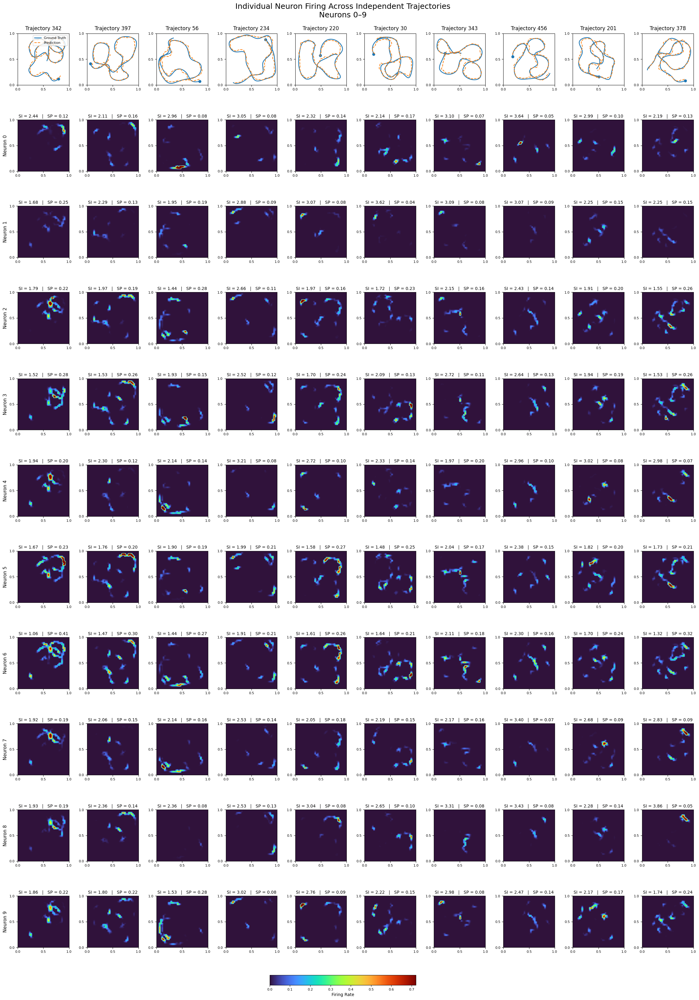

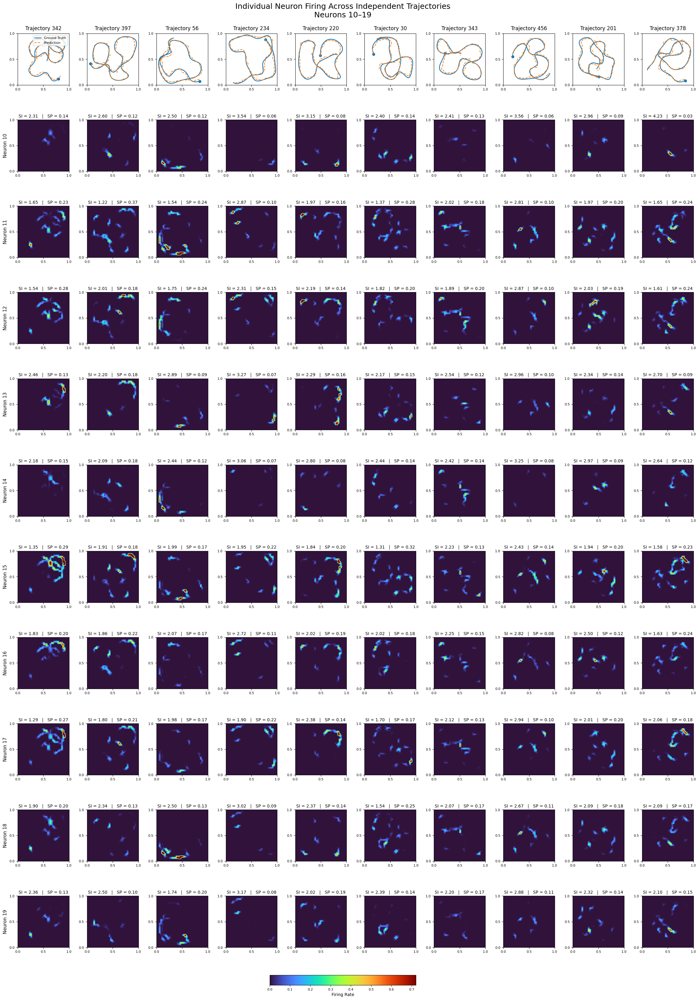

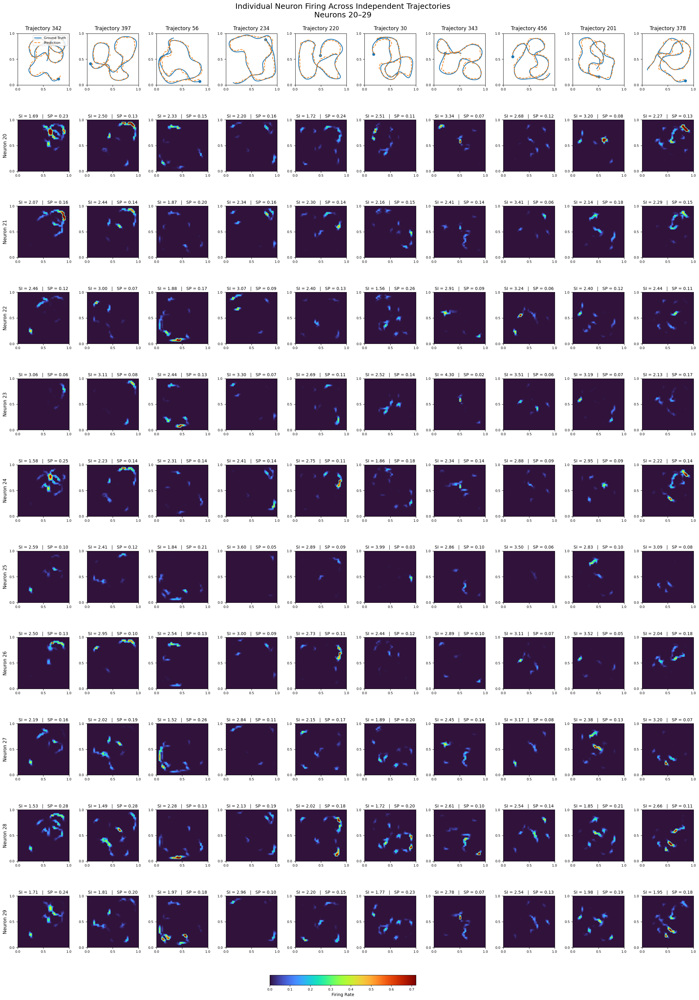

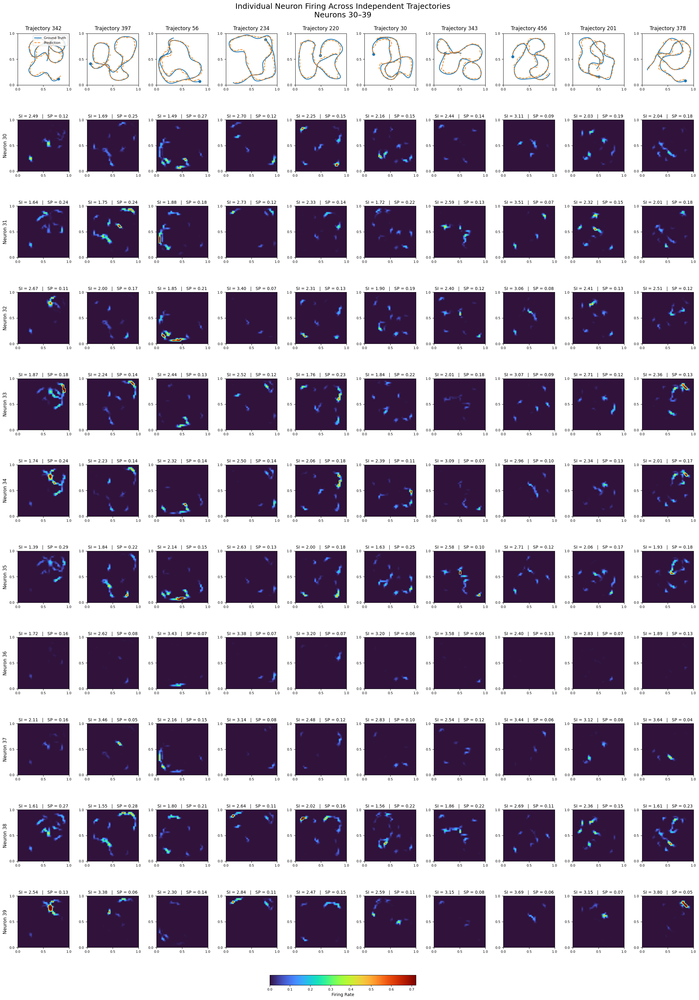

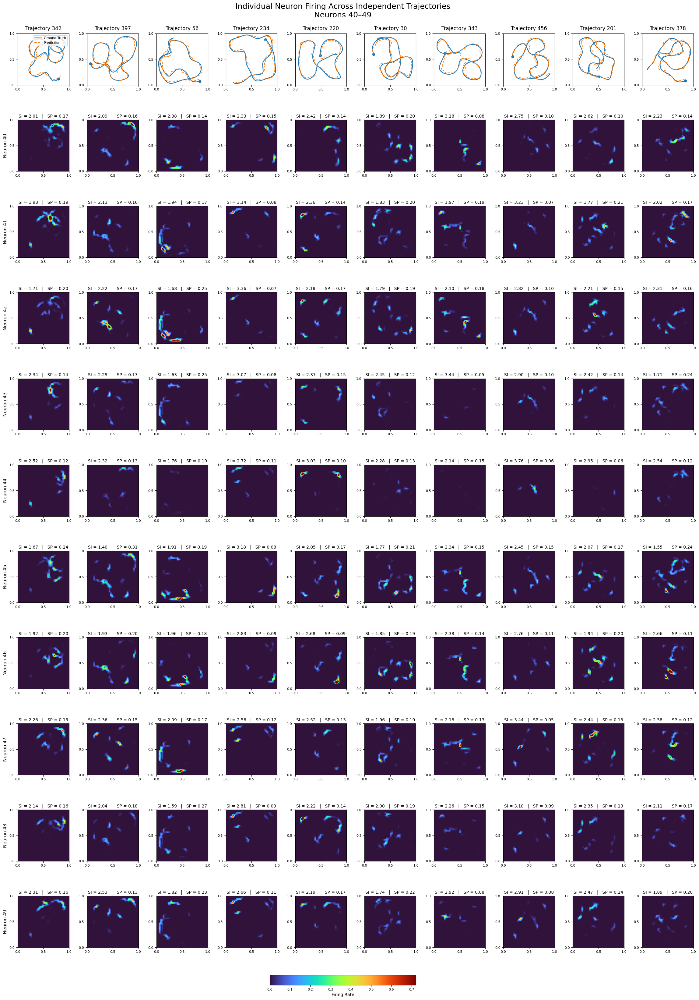

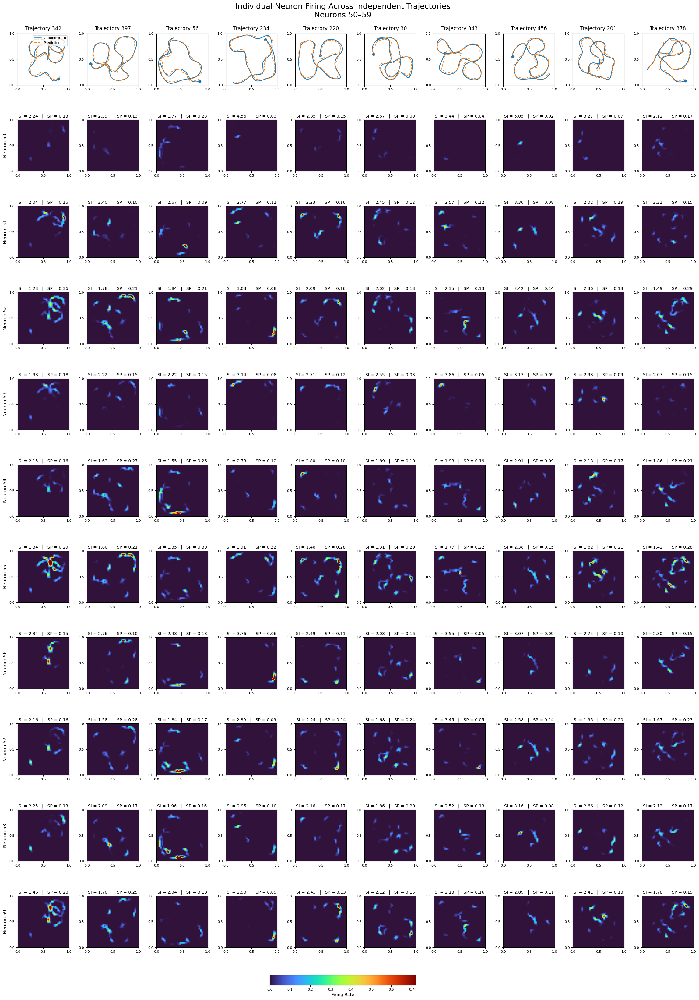

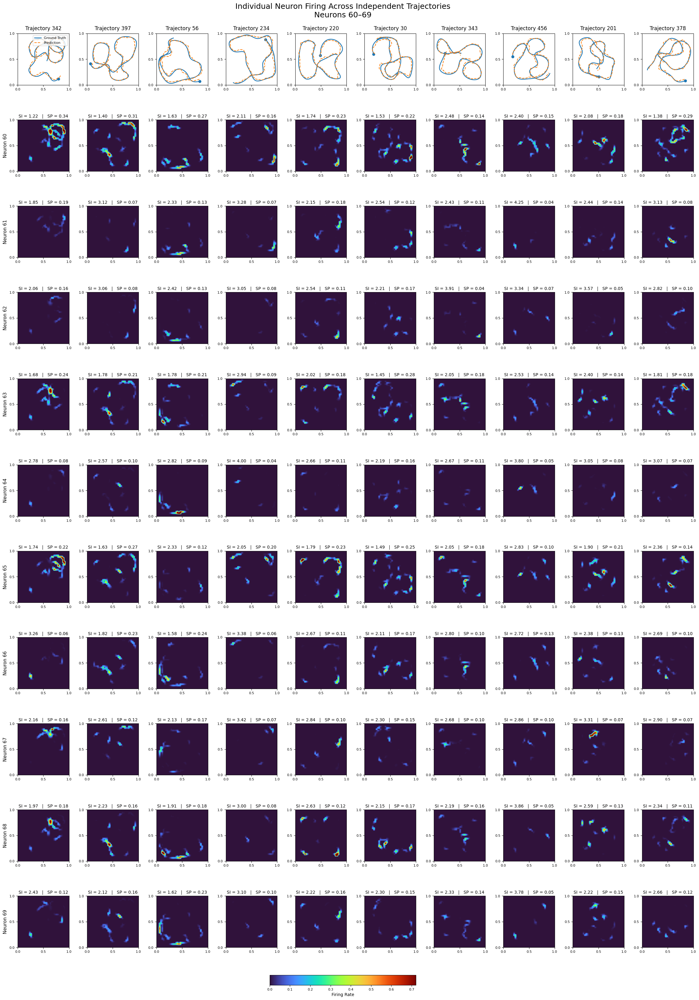

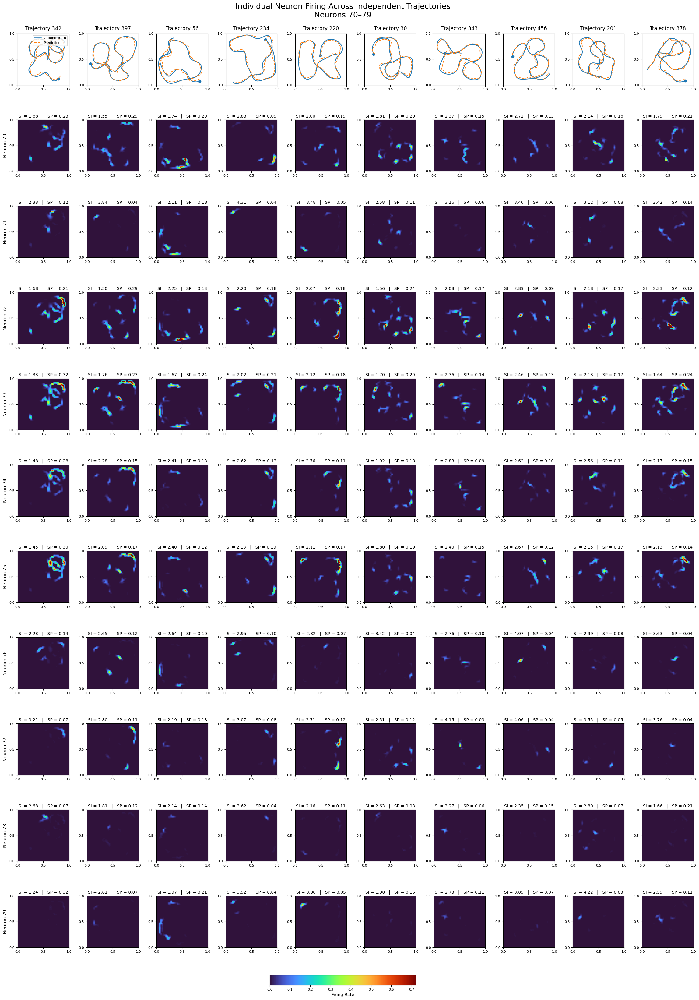

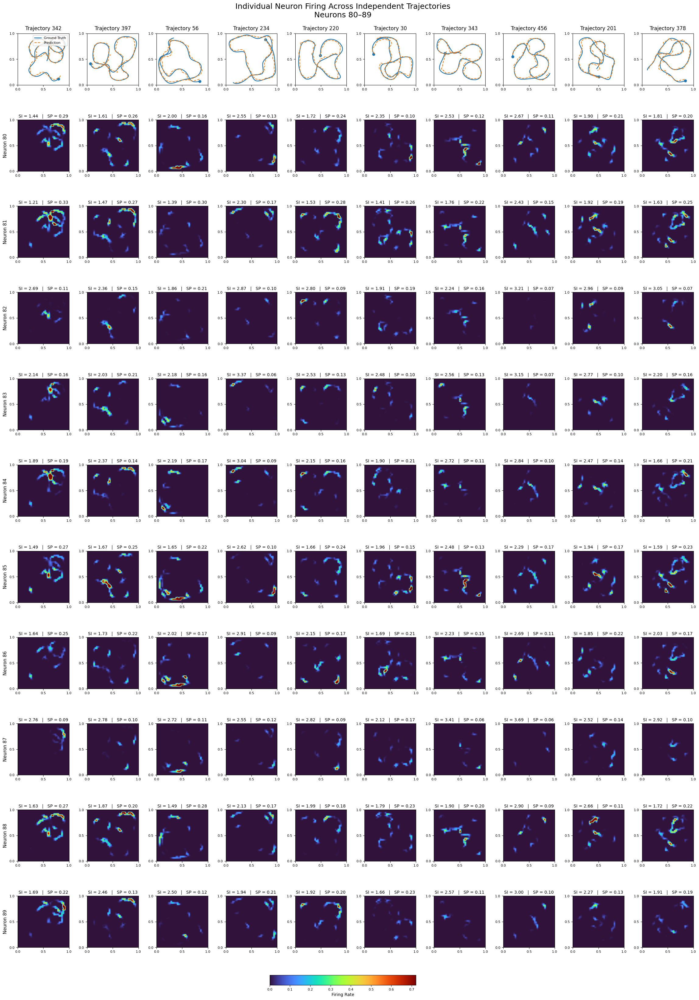

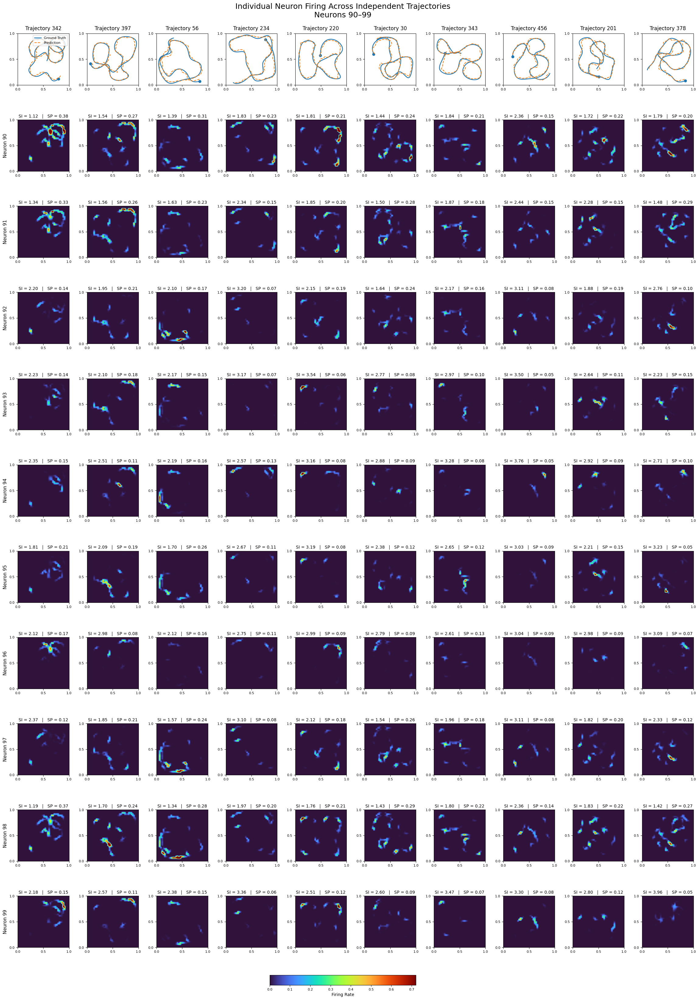

In [41]:
# ============================================================
# FIRING-RATE MAPS — SPLIT INTO 10 FIGURES
#
# Each figure:
#   Top row    = Ground Truth vs Prediction
#   Rows below = 10 neurons
#   Columns    = 10 frozen trajectories
#
# Figure 1  -> neurons 0–9
# Figure 2  -> neurons 10–19
# ...
# Figure 10 -> neurons 90–99
# ============================================================

import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# SETTINGS
# ============================================================

neurons_to_plot = list(range(N_NEURONS))

N_TRAJECTORIES = len(selected_traj)

NEURONS_PER_FIGURE = 10

N_FIGURES = int(
    np.ceil(
        len(neurons_to_plot)
        / NEURONS_PER_FIGURE
    )
)


# ============================================================
# SAFETY CHECKS
# ============================================================

assert rate_maps.shape == (
    N_TRAJECTORIES,
    N_NEURONS,
    N_BINS,
    N_BINS
)

assert spatial_information_values.shape == (
    N_TRAJECTORIES,
    N_NEURONS
)

assert sparsity_values.shape == (
    N_TRAJECTORIES,
    N_NEURONS
)


# ============================================================
# COMMON FIRING-RATE SCALE
#
# IMPORTANT:
# The same vmax is used for ALL figures so that colors
# remain comparable across all 100 neurons.
# ============================================================

displayed_rates = rate_maps[
    :,
    neurons_to_plot
]

valid_rates = displayed_rates[
    np.isfinite(displayed_rates)
    &
    (displayed_rates > 0)
]

if len(valid_rates) > 0:

    vmax = np.percentile(
        valid_rates,
        99
    )

else:

    vmax = 1.0


print(
    "Common firing-rate vmax:",
    vmax
)

print(
    "Number of figures:",
    N_FIGURES
)


# ============================================================
# CREATE FIGURES
# ============================================================

for figure_number in range(N_FIGURES):

    # --------------------------------------------------------
    # Which neurons belong to this figure?
    # --------------------------------------------------------

    start = (
        figure_number
        * NEURONS_PER_FIGURE
    )

    end = min(
        start + NEURONS_PER_FIGURE,
        len(neurons_to_plot)
    )

    figure_neurons = neurons_to_plot[
        start:end
    ]

    N_NEURONS_THIS_FIGURE = len(
        figure_neurons
    )


    # ========================================================
    # FIGURE
    # ========================================================

    fig, axes = plt.subplots(
        N_NEURONS_THIS_FIGURE + 1,
        N_TRAJECTORIES,
        figsize=(
            24,
            3.0
            * (
                N_NEURONS_THIS_FIGURE
                + 1
            )
        )
    )

    axes = np.asarray(axes)

    if axes.ndim == 1:

        axes = axes.reshape(
            N_NEURONS_THIS_FIGURE + 1,
            N_TRAJECTORIES
        )


    # ========================================================
    # TOP ROW — TRAJECTORIES
    # ========================================================

    for col, traj_id in enumerate(
        selected_traj
    ):

        ax = axes[0, col]

        # ----------------------------------------------------
        # Ground truth
        # ----------------------------------------------------

        gt = ground_truth[
            traj_id
        ]

        # ----------------------------------------------------
        # Prediction
        # ----------------------------------------------------

        pred = prediction[
            traj_id
        ]


        # ----------------------------------------------------
        # Plot ground truth
        # ----------------------------------------------------

        ax.plot(
            gt[:, 0],
            gt[:, 1],
            linewidth=1.8,
            label="Ground Truth"
        )


        # ----------------------------------------------------
        # Plot prediction
        # ----------------------------------------------------

        ax.plot(
            pred[:, 0],
            pred[:, 1],
            linewidth=1.5,
            linestyle="--",
            label="Prediction"
        )


        # ----------------------------------------------------
        # Start point
        # ----------------------------------------------------

        ax.scatter(
            gt[0, 0],
            gt[0, 1],
            s=35,
            marker="o"
        )


        # ----------------------------------------------------
        # Axis
        # ----------------------------------------------------

        ax.set_xlim(
            0,
            1
        )

        ax.set_ylim(
            0,
            1
        )

        ax.set_aspect(
            "equal"
        )


        # ----------------------------------------------------
        # Title
        # ----------------------------------------------------

        ax.set_title(
            f"Trajectory {traj_id}",
            fontsize=12,
            pad=8
        )


        ax.set_xticks(
            [0, 0.5, 1]
        )

        ax.set_yticks(
            [0, 0.5, 1]
        )

        ax.tick_params(
            labelsize=8
        )


    # ========================================================
    # FIRING-RATE MAPS
    # ========================================================

    im = None


    for row, neuron in enumerate(
        figure_neurons,
        start=1
    ):

        for col, traj_id in enumerate(
            selected_traj
        ):

            ax = axes[
                row,
                col
            ]


            # ------------------------------------------------
            # Rate map
            # ------------------------------------------------
            #
            # col corresponds to the position of this
            # trajectory inside selected_traj.
            #
            # rate_maps shape:
            # (trajectory, neuron, x, y)
            # ------------------------------------------------

            rate_map = rate_maps[
                col,
                neuron
            ].copy()


            # ------------------------------------------------
            # Replace NaN/unvisited bins with zero ONLY
            # for visualization.
            #
            # The original rate_maps remain unchanged.
            # ------------------------------------------------

            rate_map_display = np.nan_to_num(
                rate_map,
                nan=0.0,
                posinf=0.0,
                neginf=0.0
            )


            # ------------------------------------------------
            # Plot firing-rate map
            # ------------------------------------------------

            im = ax.imshow(
                rate_map_display.T,
                origin="lower",
                extent=[
                    0,
                    1,
                    0,
                    1
                ],
                cmap="turbo",
                aspect="equal",
                interpolation="bilinear",
                vmin=0,
                vmax=vmax
            )


            # ------------------------------------------------
            # Spatial Information
            # ------------------------------------------------

            si = spatial_information_values[
                col,
                neuron
            ]


            # ------------------------------------------------
            # Sparsity
            # ------------------------------------------------

            sp = sparsity_values[
                col,
                neuron
            ]


            # ------------------------------------------------
            # Title
            # ------------------------------------------------

            ax.set_title(
                f"SI = {si:.2f}   |   SP = {sp:.2f}",
                fontsize=10,
                pad=6
            )


            # ------------------------------------------------
            # Axis
            # ------------------------------------------------

            ax.set_xlim(
                0,
                1
            )

            ax.set_ylim(
                0,
                1
            )


            ax.set_xticks(
                [0, 0.5, 1]
            )

            ax.set_yticks(
                [0, 0.5, 1]
            )

            ax.tick_params(
                labelsize=8
            )


        # ----------------------------------------------------
        # Neuron label
        # ----------------------------------------------------

        axes[
            row,
            0
        ].set_ylabel(
            f"Neuron {neuron}",
            fontsize=11
        )


    # ========================================================
    # TRAJECTORY LEGEND
    # ========================================================

    axes[
        0,
        0
    ].legend(
        fontsize=8,
        loc="upper right"
    )


    # ========================================================
    # TITLE
    # ========================================================

    first_neuron = figure_neurons[0]
    last_neuron = figure_neurons[-1]


    fig.suptitle(
        (
            "Individual Neuron Firing Across "
            "Independent Trajectories\n"
            f"Neurons {first_neuron}–{last_neuron}"
        ),
        fontsize=18,
        y=0.995
    )


    # ========================================================
    # LAYOUT
    # ========================================================

    plt.subplots_adjust(
        left=0.055,
        right=0.98,
        bottom=0.055,
        top=0.965,
        wspace=0.35,
        hspace=0.65
    )


    # ========================================================
    # COMPACT HORIZONTAL COLORBAR
    # ========================================================

    cbar_ax = fig.add_axes(
        [
            0.40,
            0.018,
            0.20,
            0.010
        ]
    )


    cbar = fig.colorbar(
        im,
        cax=cbar_ax,
        orientation="horizontal"
    )


    cbar.set_label(
        "Firing Rate",
        fontsize=10,
        labelpad=4
    )


    cbar.ax.tick_params(
        labelsize=8
    )


    # ========================================================
    # SHOW
    # ========================================================

    plt.show()

In [42]:
# ============================================================
# BEST PLACE-CELL CANDIDATES
# ============================================================

import numpy as np


# ============================================================
# 1. HIGHEST SPATIAL INFORMATION
# ============================================================

max_si_index = np.nanargmax(
    spatial_information_values
)

si_traj, si_neuron = np.unravel_index(
    max_si_index,
    spatial_information_values.shape
)

max_si = spatial_information_values[
    si_traj,
    si_neuron
]

si_traj_id = selected_traj[
    si_traj
]


# ============================================================
# 2. LOWEST SPARSITY
# ============================================================

min_sp_index = np.nanargmin(
    sparsity_values
)

sp_traj, sp_neuron = np.unravel_index(
    min_sp_index,
    sparsity_values.shape
)

min_sp = sparsity_values[
    sp_traj,
    sp_neuron
]

sp_traj_id = selected_traj[
    sp_traj
]


# ============================================================
# 3. PRINT BEST INDIVIDUAL RESULTS
# ============================================================

print("=" * 60)
print("BEST SPATIAL INFORMATION")
print("=" * 60)

print(
    f"Neuron              : {si_neuron}"
)

print(
    f"Trajectory           : {si_traj_id}"
)

print(
    f"Trajectory index     : {si_traj}"
)

print(
    f"Spatial Information  : {max_si:.6f}"
)


print("\n" + "=" * 60)
print("LOWEST SPARSITY")
print("=" * 60)

print(
    f"Neuron              : {sp_neuron}"
)

print(
    f"Trajectory           : {sp_traj_id}"
)

print(
    f"Trajectory index     : {sp_traj}"
)

print(
    f"Sparsity            : {min_sp:.6f}"
)


# ============================================================
# 4. RANK NEURONS BY AVERAGE PERFORMANCE
#
# This is more useful if you want neurons that perform
# consistently across all 10 trajectories rather than a
# neuron that happens to be exceptional on only one trajectory.
# ============================================================

mean_si = np.nanmean(
    spatial_information_values,
    axis=0
)

mean_sparsity = np.nanmean(
    sparsity_values,
    axis=0
)


# ------------------------------------------------------------
# Top 20 neurons by mean SI
# ------------------------------------------------------------

top_si_neurons = np.argsort(
    np.nan_to_num(
        mean_si,
        nan=-np.inf
    )
)[::-1]


print("\n" + "=" * 60)
print("TOP 20 NEURONS BY MEAN SPATIAL INFORMATION")
print("=" * 60)

for rank, neuron in enumerate(
    top_si_neurons[:20],
    start=1
):

    print(
        f"{rank:2d}. "
        f"Neuron {neuron:3d} | "
        f"Mean SI = {mean_si[neuron]:.6f} | "
        f"Mean Sparsity = {mean_sparsity[neuron]:.6f}"
    )


# ------------------------------------------------------------
# Top 20 neurons by lowest mean sparsity
# ------------------------------------------------------------

lowest_sparsity_neurons = np.argsort(
    np.nan_to_num(
        mean_sparsity,
        nan=np.inf
    )
)


print("\n" + "=" * 60)
print("TOP 20 NEURONS BY LOWEST MEAN SPARSITY")
print("=" * 60)

for rank, neuron in enumerate(
    lowest_sparsity_neurons[:20],
    start=1
):

    print(
        f"{rank:2d}. "
        f"Neuron {neuron:3d} | "
        f"Mean SI = {mean_si[neuron]:.6f} | "
        f"Mean Sparsity = {mean_sparsity[neuron]:.6f}"
    )

BEST SPATIAL INFORMATION
Neuron              : 50
Trajectory           : 456
Trajectory index     : 7
Spatial Information  : 5.047234

LOWEST SPARSITY
Neuron              : 50
Trajectory           : 456
Trajectory index     : 7
Sparsity            : 0.018874

TOP 20 NEURONS BY MEAN SPATIAL INFORMATION
 1. Neuron  77 | Mean SI = 3.201115 | Mean Sparsity = 0.079801
 2. Neuron  71 | Mean SI = 3.080806 | Mean Sparsity = 0.087684
 3. Neuron  23 | Mean SI = 3.024613 | Mean Sparsity = 0.091814
 4. Neuron  76 | Mean SI = 3.021086 | Mean Sparsity = 0.082477
 5. Neuron  39 | Mean SI = 2.991238 | Mean Sparsity = 0.094015
 6. Neuron  50 | Mean SI = 2.986109 | Mean Sparsity = 0.105541
 7. Neuron  10 | Mean SI = 2.966609 | Mean Sparsity = 0.096327
 8. Neuron  64 | Mean SI = 2.961376 | Mean Sparsity = 0.088695
 9. Neuron  25 | Mean SI = 2.958498 | Mean Sparsity = 0.094450
10. Neuron  99 | Mean SI = 2.912962 | Mean Sparsity = 0.099022
11. Neuron  62 | Mean SI = 2.898847 | Mean Sparsity = 0.099487
12. 